In [1]:
from fastai.vision.all import *

In [2]:
path= untar_data(URLs.PETS)/'images'

In [3]:
files= get_image_files(path) # 이미지파일들의 이름을 모두 복붙하여 리스트를 만든뒤에 files.txt로 저장하는 과정으로 비유할 수 있음

In [13]:
print(files[5]) #txt 파일의 5번째 목록

C:\Users\user\.fastai\data\oxford-iiit-pet\images\Abyssinian_103.jpg


In [5]:
def label_func(f):
    if f[0].isupper():
        return 'cat'
    else:
        return 'dog'

In [6]:
label_func('abc')

'dog'

In [7]:
dls=ImageDataLoaders.from_name_func(path,files,label_func,item_tfms=Resize(224))

Due to IPython and Windows limitation, python multiprocessing isn't available now.
So `number_workers` is changed to 0 to avoid getting stuck


In [10]:
ImageDataLoaders?

Init signature: ImageDataLoaders(*loaders, path='.', device=None)
Docstring:      Basic wrapper around several `DataLoader`s with factory methods for computer vision problems
File:           c:\users\user\anaconda3\envs\bda2021\lib\site-packages\fastai\vision\data.py
Type:           type
Subclasses:     


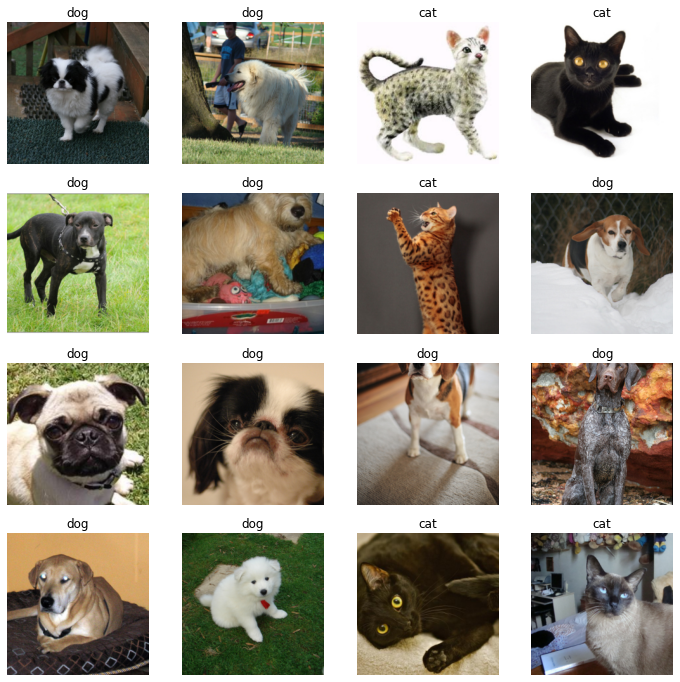

In [8]:
dls.show_batch(max_n=16)

In [11]:
# 여기까지 설치하고 커널을 재시작하면 정상적으로 모형이 만들어진다.
#metrics : 평가지표!!

In [9]:
learn= cnn_learner(dls,resnet34,metrics=error_rate)

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to C:\Users\user/.cache\torch\hub\checkpoints\resnet34-b627a593.pth


  0%|          | 0.00/83.3M [00:00<?, ?B/s]

C:\Users\user\anaconda3\envs\bda2021\lib\site-packages\torch\nn\functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  ..\c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


In [12]:
learn.fine_tune(1)

epoch,train_loss,valid_loss,error_rate,time
0,0.139810,0.032168,0.013532,04:30


epoch,train_loss,valid_loss,error_rate,time
0,0.048791,0.012138,0.004736,01:45


In [17]:
learn.predict(files[555])

('dog', tensor(1), tensor([9.7912e-08, 1.0000e+00]))

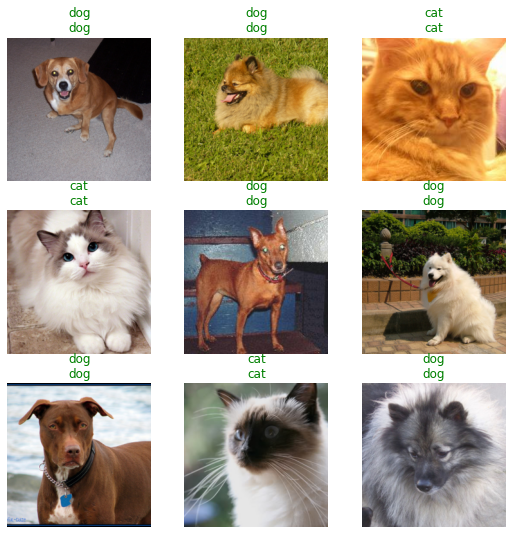

In [26]:
learn.show_results()

In [20]:
#오답분석

In [21]:
interp = Interpretation.from_learner(learn)

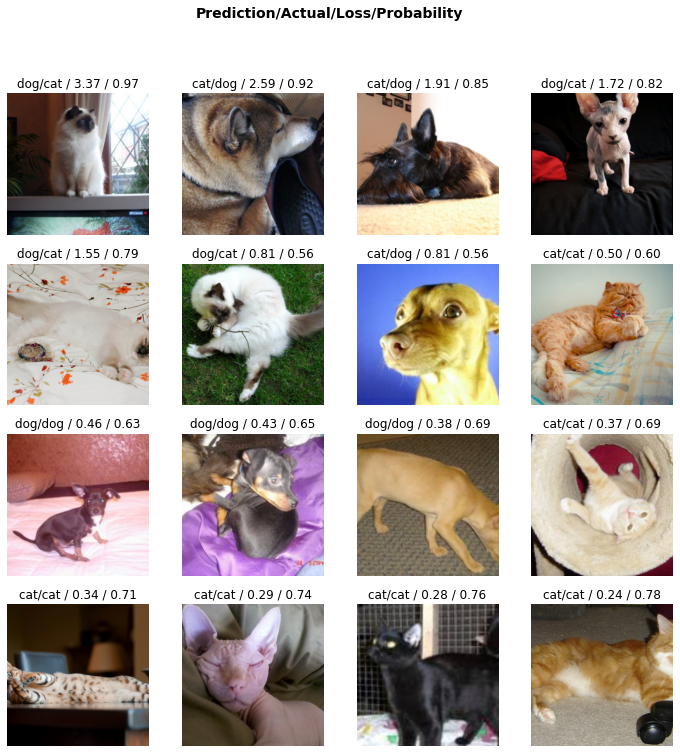

In [28]:
interp.plot_top_losses(16)

In [32]:
### 진짜 잘되는게 맞는가?


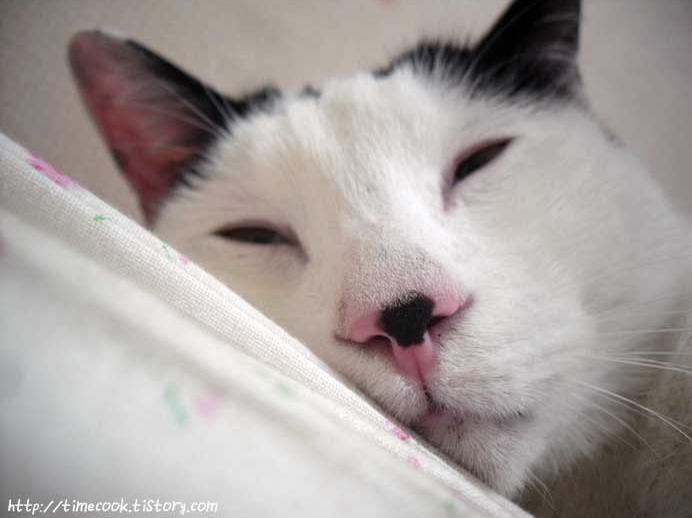

In [33]:
PILImage.create('2021-09-06-cat1.png')

In [35]:
learn.predict(PILImage.create('2021-09-06-cat1.png'))

('cat', tensor(0), tensor([1.0000e+00, 3.5201e-11]))

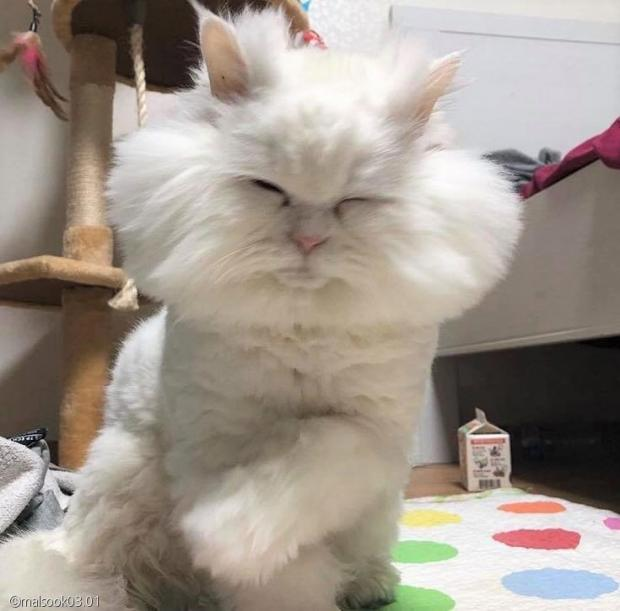

In [38]:
PILImage.create('2021-09-06-cat2.jpeg')

In [39]:
learn.predict(PILImage.create('2021-09-06-cat2.jpeg'))

('cat', tensor(0), tensor([1.0000e+00, 1.4637e-06]))

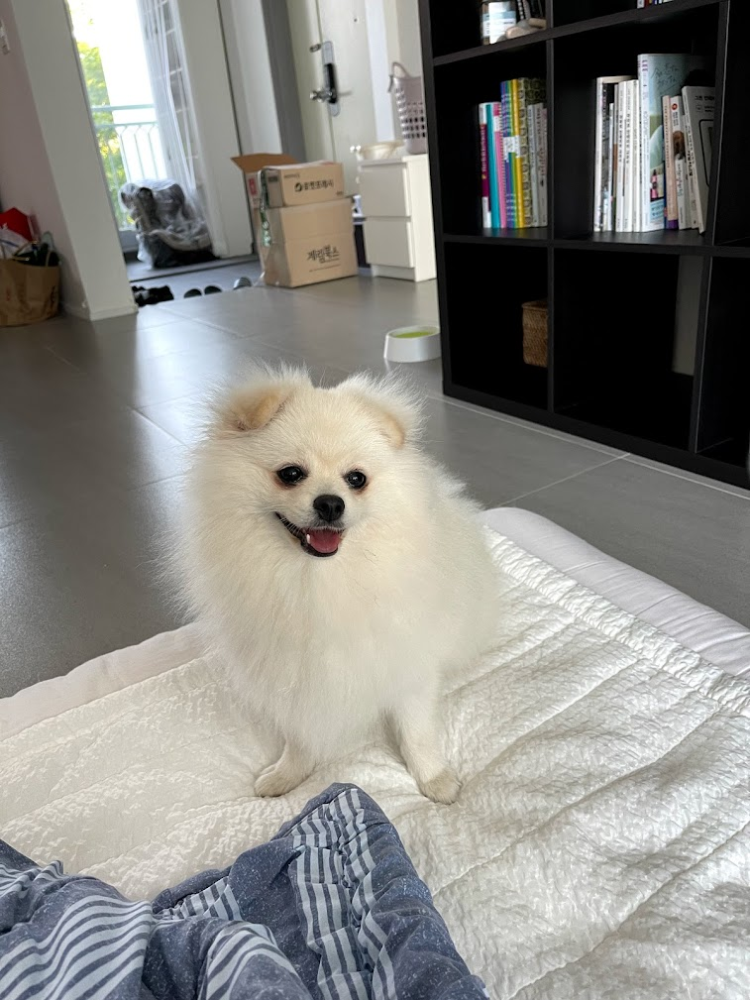

In [40]:
PILImage.create('2021-09-06-hani01.jpeg')

In [42]:
learn.predict(PILImage.create('2021-09-06-hani01.jpeg'))

('dog', tensor(1), tensor([1.1690e-07, 1.0000e+00]))

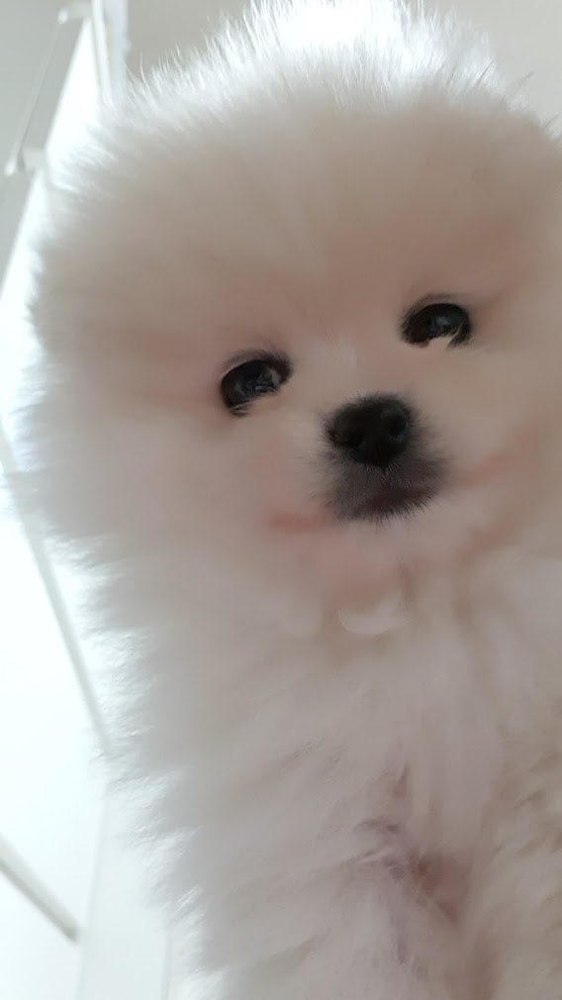

In [43]:
PILImage.create('2021-09-06-hani02.jpeg')

In [44]:
learn.predict(PILImage.create('2021-09-06-hani02.jpeg'))

('dog', tensor(1), tensor([0.1461, 0.8539]))

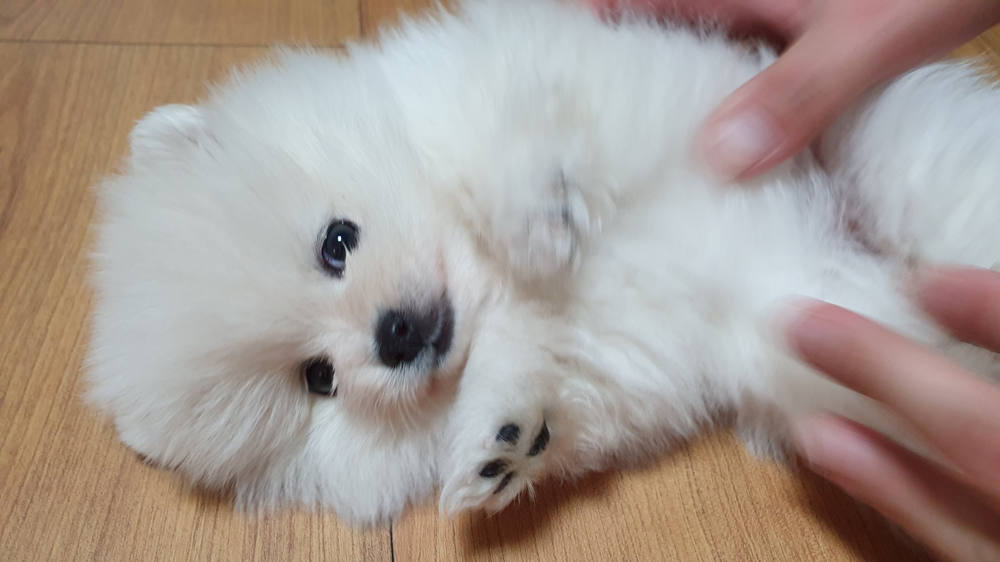

In [45]:
PILImage.create('2021-09-06-hani03.jpg')

In [46]:
learn.predict(PILImage.create('2021-09-06-hani03.jpg'))

('dog', tensor(1), tensor([0.4243, 0.5757]))

In [56]:
import PIL
urls='data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wCEAAoHCBUVFRgWFRYYGBgaGBoaGBkaGhgZGhgYGBgaGRoYGBocIS4lHB4rIRgYJjgnKy8xNTU1GiQ7QDszPy40NTEBDAwMEA8QHhISHjQhISE0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDE0NDQ0NDE0MTQ0NDQxNDQ0NDQ0NDQ0NDQ0NP/AABEIAMIBAwMBIgACEQEDEQH/xAAbAAACAwEBAQAAAAAAAAAAAAADBAACBQEGB//EADoQAAIBAgQEAwYGAQMEAwAAAAECAAMRBCExQQUSUWEGcYETIpGhsfAUMkLB0eFyUoLxYnOSsiMkU//EABgBAAMBAQAAAAAAAAAAAAAAAAABAgME/8QAIREBAQEBAAIDAQEAAwAAAAAAAAECESExAxJBURNhcYH/2gAMAwEAAhEDEQA/APo9GpHEeYVLERynio1NhXEIHmSuKhPxMA0WqQbVog+IgHxMfCaLYiAfERBq8GXvGRp8RAtWMFecgFi85ecvJAnZJwQ1PCO2YGXU5Q6YJkvGxhFH5nUdhmflOk4dPzMTb0i+2T+tJS6IToCZx+P4ZckQHuf7h6PiJGyDInSw/fSK7/4OZqq4Vzop+Eq+GdcypHpK1eO01a7YgEZZILjuCTbtGKfinChbmre+xz01kf6zvKf+d54KkW1nLxs+IsG4zb5W+kXHEcJszGP/AFz/AEf56/ik5NKlh6NQe4wB6axXE4Jk1Fx1Gn9S87mvSbLPZe85OSSkpKmdnDAKmVMuZQwAZlWEIZVoAK0k7JAFaWJjC4qYdOvDpXiU3ExRh1xBmRTeNI8CPirIXiyvIakAYDy4aJ+0hEqQIzJKK01OGYXmzZfd65Z9usLeGDQ4e7i4t63H7Q6cMA/MwB6DP72luJYu+QbkRT7z/wCq36V65ieO4r4jIBSl7qZknUsTqSfhM/tb6VM/16TH8RpUBla462JMwDxariDfn9nSB1/U2drL/M8urPUa7kkX+MeesbWvkIc/q+89NqtxNEBVb+d7k+ZmJisezXAyB1i9rzhSOSQeaGrQoubiVVJdAJGqrMYGLqFSQb5QNKozAECaPGKYVle2Te63Y7H6zPWmVYhdNQJyanNeXVm9ybos3W319LxpKxG9/kf7matQjaVfE52iOPQ4Tjr0z7rW8wCJ7fgHjBHHLWIB/wBW3qJ8iatA1MWV0PztKxbPMTvGdTlfeMXgA3v0iGB2Bv8ACZrKRkRbznyfhHiWth25kYjqLmx8wMp9P8L+LqeMHs6wCudP+ryO06cfP+WOXfw2eZ5GJkJhsdQKOV21HcbRRnm/WCxMqTBs8r7SBiyjGV9pBu8AtedivtZ2A48qtaNYepeZaGPYcwU26DxxHmZh3jaPBJ0PKs8GrQNV7QJZq+cPRqTKOLa9hn2IDfI6ekdoXtcqydLg8pPQE6fP0i6fGvTM38IyUaRdshbc69BaYfCsOzsBmBuRtE/E/FQ7ezQ+6uQ6EjU/tFq/is56zON8VaoSNFzNttZhU0LtbYaxisYWgoRSTqZPeL4jKBlsIN4vUxWeU6lW+sV0qZEAhRTgwRLipaT3p845ywnJ0lfaTqPAwcVQDoyNowt/c83hCVPI/wCZGK369Lz1L5Tz3FaRFa4y5lHxUgX+cy+SdnWnx3zxKxuZnVznlHcS2eeukzqjTNrIjtlEcS/yjLnKKVNY4WnaQmjhcUyEFSQQcj3majQyOYUSeH1LgXi9KqLSxRIIyWpry/59ps16LBQ62dDmHQ8ykeY09Z8dWraanB+OVsOwam7LnmBofSaZ+W58e2W/gmvM8PfVK0XOKmpRx1PG4csoT2wFyQoUnrf/AJnjauIIJE6Mbmp2ObWLm8reGKnHxEwUxUL+Jllxqe3kmT+InIAgpjSPM5XhkeAbNGrGqdWY9OrGUrQLjaV4DEPlFlxEBWxECV/FBSeZFcdDl8xmPQzV4PyNUUI5pkkAo7DO+wYDPyZR5meYq1s79DebPh7Cghq75rTzAubs+o2k6vJ1eZ3w9xx7HrhqYp0wAzDO36VOtuhM8O4uc+sZxOLNZy7HM7dNrDoNIo5tOb7XreY5FuUc3zncSp5fOCpvcw2IcFdbR3QmWItNi19uv8RlwtrEm/aUxOKVBcmw+G+kxqviGnzcoF+5IF8xv8YZtOyNpaY/Sx+N4emp3mVhuKU3/VY9CdfJps4erzD6HWVNJuUVbQtzIoINoYJJuj+pZ2NpjcUPNbOxBI9DN90G8x+J0MrydXsVnxWVVW1xe8UZJoMmV/KBKamZSt+cIusSxImlVG8Sri5lZpangKmuUKq5SlM2yh0BMKefQbEziVc4R1yiFFszCTsK3leu8O+IPw1QMc1OTDt27x3i+VQsM0qf/IhGjI9yCPmPMGeUw9MMc7z01JD+E979FSyHs4Jdb9AVB/3nrK+HX11z+o+bPc9/gAqS/tYoGkLztcZn2skU5pIBFaEV4BZcSZRYaSpDpUiKmER5QaArQVStFueUZ4FxZ3vGsTxF6ODYqDnUzOVgAN/M2mfeOYVfaJVo7vTYL2cZj6SNzuV4vKH4d4ozowfXm01yIH8TVxFb77zM4PS5VZ2XlJOY2uOnQX2722vLtU5mmP18tft4NCobZfdoHH4uyenf4TocTNroWLX1zyvl/wAWi/TeZxuNd73MQp1LNc53Fpq4zhx58t8xOJwcnWaSzjLWdWgNikt7q3y7gg+c1/D1TEKyjMqdjcD07xvh3BkU3K3I+X3/ABPTYTBAZ2z30+cjWp6XnNnmm6ZuBlaFRu0MqC0pyGY3q5YowuJjcVbKwm44ImDxnPt3hfSs+2en0lMQuRPpJSNj27zuJuQPjMo3s8kHOUVZNY1UBgFS4MuUuAcltOsYpLL0xlnLld4reqkLYlcotg6Fz5xyutwZfDUGsFUEsxsB1JMf28cH189avh7Bq7m+SLm7fsPPSM8Y4m1Q8gstND7iqLAbevnL8Qb2CfhlFiCGqN1e35fIX+UyJ0/D8fJ9r7cXzfJ28np28hM5ecvOhi7eSVvJALJCCCQy4Mg1zOc0qTOEyoS/NKM8qWlCYyFDRrhrEVEI2YE9huT2teTh/DKlVWdRyot+Z2uEBAvy3AzY5WUZ5y71EQcqm5Op3PbsO0m+jhniGIBPKmS5/GII4uBAmtfaERJnfHiNJ5OhsouRmYRFtOssyrWKNhr+sLRwoy+fqevr9YWnpp92vGKK7b69QL53+/7j/C/TWDojpp+80OW2WV4DDgAdPpDoLnfzyMimMizrJLqssVlcR0rUOU8/xixnoaxtPP8AGkupmevTXHtiKc765ad4asesCz2FtJZiLATJ0Avv3gUFrj7vOM5BI2hEzNzpGI4glmzEu0rRTnNgP77SemlHDc+d7Cey4Bwf2Vqr/mt7i7qD+tuh6CK8N4Ty2dwL7L08+83FN5pjPb2sfk345GT4xwnMExCjUcj26jRj6Zek8pefSWpq9NkbQ5Htf9XobT5ziqDU3ZHFmUkH03nbjXjjj1P0OcJnCZwmaIWvJKXkgEQwgaBSFAkqXnDJLUwM+bQam9rfI/C0Zew56bhvh5aSe3xqsqWulG/K9Tu+6J8zfbdfB+J8PhR/9fDl6v8A+tVlLD/FQLKPLPvMDjXifE4hjzMF7Afucz6yNat8Rcx+1peIPFj1AKdNVp01yVEHKo8hMCnXN7sSZmiuwb3s5o03JGvp3kWWQ82WtTDkEdTGUW0Qoow5cr31I29JqU6Z3kW9XzjvNLIk6aEJTTORVyCUqRtGEFrWG+X8S+Gpx0UflHmloJDNCgsSNPpGqAMqRNpxRLFZVDCQqGfjENsv6mFxZSEbsLz1FZLiZePw/MpXqCJlqNsV87euSc4anUvlF8ZTZHKnUQSNnJ54dHT1QfGXDWg+e9vKGoUSxtbWScVpqzm2dp6nhHDggDHNtug/uK4bChAAPzHU/wATQoVCIZ53yndvORqAQoi1F7xkTojlqyPby3tMfxPgvaotVAS6AK4GZZBo3mPp5TW2izOVa4NiI+3Nlhc74eBvOEza8Q8PVSKtMWR9V2R9wOxmJedOdTU7GOs3N5UkkkjJ1IdRF0MZQyDQiFej7q9Mz633+UrI9UBRfS/If9x90/En0k67zw0+Oya8k8aqJm7WvpqfpFmwuXMCCDmCNCIPj1NmCkbZHz+84pgceypycnNa9je1r7fGZyXnW13PtyzwtikspJtsB5k/xcwvDCdICuXbNsuijQX3j/D6IG4uZX4yvnXW5gxln93mlSEzMOD9LER2m50PTXymbU+tMTnss4BahBz06xujnIpymKaxqnr+8CojFMS5EWiKkKiWlUMIGlRm6otO80rIYtHFmi9UXhSZW8y1Wkjy/iHg3tBzovvjUdQJ46pTIYgix3E+sWEzcfwejVPMy2bqMvjJ9Nc6/K8HhqBZgAL5z1GC4fyLf9R17XjuG4YlIkrmepzlqjyL5X9v4HTp5wzqOkpRuTeGeETfYaEjMR2nUuIpyy6TTOr3jPWZfJ0GLVzDE+7FK201rPIJQOCjflccpPQ7H4zx+KwzU3ZHFmU2P7EdjrPXOLwfEsAcTTBW3taYttd06dyPvWP49fW8vqjeftOz8eQkneQ9D8DJOpzqIYwhi6CHEgxOaN4Cj7QOgBL2V0yvdkN7HsQT62meTGsA/vi7EKpDG2VyuY89PrCzwcvlntirMRy22IOdj95ROpyrprnn59pveLMCA/tVBC1AHtuOYZg973nn3TmW49Zn9Wn2pdDc659+02MHY2try6gfG0yqNwcvIAib+Ee3KAo7kbfzCjJmkpsCBY9GuN87RxHY2yFt+t5SiDc3A7G+Z0vlGqZcqLBQ1/8AIa/HSRYuV1KLN+axB07fzHsJTseo2lEptcEnLS23rCs3KLD0kKNKBCKYnQck5xgHOXEWGVaEQ3i4eFRpXEDmUljpAFwB3kaqsx12lbwTVoNsR95TCtZDJqQVSqIo9UwRbqfnJXMiVasVsWM7y3ORh0TlgvxBUFhaXVZylTOp+cOBHGdoVrTiy9QQQlT2n3BnOUWqxgmL1Gm3tnC4adSoyMHU2Ig3bORGvlFxcrZ9vhW950BY5nTWSYskOX+l4eRQwl4srQgadTmXZobCVeW7ZX/TfS+vroD6C2ZFlWMoGtHwuvV1LVqDU78z015wd2Vmbm+ee+s8i5KMba5W7jp8pp8IxzJVVxoAbr1VUb3DGfEHDivLWpAvTJDDtf8AQ42IvM9Ti83rEVFa36W6bHyj2FPICWOdhlme2Q9YM4QOOdDcbj/T5w2FwrZWcZHRvLr1iVGrQflF2N76E5anp6xlXIAOQN9he/UC8z6IN+VwTcgi+YB7EeYmhSosVOWl7C40ysLj1k8iumFrHW0uhzz0P39+UXRH5feFm232676fIwwJyDaybFRd64UdvpLjFb/H0mLjeILTJBPMc7DtrYHQzPq+IVGmudsjZslIO2xH/MUl/BbJ7esGMU6TQwrXznzIcZeo45Lj3gOXbM2uO39en0nAo3J3j8zxU+LOwzUfpFHBj60DI1CTqdOXjJekZwUzNFqMp7MDSR9V/Yl+HG857MWO8bZZQrFciapNjbKXp5mUrrn9+UJRWxmda98GlP8AUnNKs2gnRLjOqZ6ncwBbOMneLNCiDA3EXqGWDWEC2c2l7Ec4DVECz2jFQZRWrpDh9F9tJEpI+k8yjQgaASFE6HOsTKkyGcMoqtRezA7b+RyPyJmtheMPSZ7BWDKoKnNWAtdT8WN/KY0l4rOlLx62m2FR+ZQ9MkKxReVlPOqkDP8A7ij1mhh8HhKrAq3KxAIXT82lu5sfhPEVKxO+yj4KoI+Kj4QtHEG4/wAH+I53B887eUz+q/s+jvhVUWCBh3/mVCoNEsQep7/3PJcG8SVUNnJddOUm512vpYEz1mG4xQqEKHAY/pOWYFzY6aTLWdRpnUooVXtfIjqNfKDxGCJBzvHWKAcxdQOvMM7C+XX0mDxXxQqDlwzWYOOapZHRk5TcKGvne2xBz6ZkzdHdTJF+Ahrqy3zuD0vqBMnH+FCxHKwFv9Q657d7zRwfiGojXqnnWxsMgSBf38hkCbAdb72z3eGcZw9d+QBla+QIFj0sbxfTWfSrvOvbF8P+GFptzsQ79hYDy6nvPSYjEcgsguw66D+5omnYe6BEK1GRrVn/AGeZP/C1PixJsbqen8HeMDGnseomZjcL2itKsR7pPrMfvqNZjN9PUIyutxKPTmdwuvZrdf2mw01zr7RnrP1pBk+8oN1t5/SOuIs6+sqphKuuQg11EYrC/wBBA8mdvu8yrTN8COZxZSo04tSEFEJvrBNIzdAe86BK4ShOVpQLLObaStresqXhUN1i1RY4+0A6zSIpHlnIblnIB5FYW0ArQgedDBe04ROc07KSqROTpkgEl6Rz9GHxUj95UTtoBA5tYTpfO/lb0tb6TlpyAENUm187aXz3vb4k/EwrVxqEQf8Am3ydiIvIrW/vP5bwLpiq+Vybs1ib68o0v52B8gOsmDxHI4exuNLEDzuCDcW2ygGck3OZMhRrXsbaXsbX6XiD6r4fxnt6IcaqAGtoOgyvY5aRx0lPAXKuD5inJctkAbNb3b575ZkQrG85tzrozSNalMXGYfOeicTPxaTm1lvjXKRom1iNRNbDYm4sZho9td/v9o1TqdIpri9Z612aK1WGu8AtY6SF7yrvrP68cY33lTOsZxhc32+7ffeAArOIBHzhMSuUWovY2h+r/D6ypy+EorTrtLjPijft9/WQnScJgwc4Q76WcyrG4nGaDZ5okDlkkkgHill1kknU5RVlxJJGSGSSSAQTskkDcMkkkCckkkgEMNhMQ/5eZrc2lzb4TkkRx9b4U5/CJmdv/UTqySTmb/irxLEaSSTHbTDDxGp8jDYfb73MkkxdH4PDJJJHE1HlB+85JLjOuPofIzM3kkhVQyv7S0kkogzKGSSOFVT+/wC0GZJJpPSVJJJIyf/Z'
urllib.request.urlretrieve(urls,'test.png')


('test.png', <email.message.Message at 0x1af0f4569a0>)

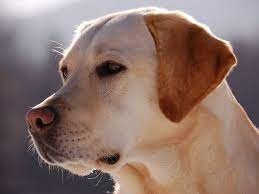

In [57]:
PILImage.create('test.png')


In [58]:
learn.predict(PILImage.create('test.png'))

('dog', tensor(1), tensor([8.8796e-06, 9.9999e-01]))